#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [7]:
!nvidia-smi

Thu Apr 17 19:13:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.94                 Driver Version: 560.94         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070 ...  WDDM  |   00000000:01:00.0  On |                  N/A |
| N/A   50C    P5              6W /  135W |    2221MiB /   8188MiB |     16%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 15814, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 15814 (delta 9), reused 26 (delta 2), pack-reused 15769
Receiving objects: 100% (15814/15814), 14.59 MiB | 24.33 MiB/s, done.
Resolving deltas: 100% (10823/10823), done.


In [5]:
%pwd

'/content/yolov5'

In [4]:
%cd yolov5

/content/yolov5


In [1]:
%pip install gitpython>=3.1.30 matplotlib>=3.3 numpy>=1.23.5 opencv-python>=4.1.1 pillow>=10.3.0 psutil PyYAML>=5.3.1 requests>=2.32.2 scipy>=1.4.1 thop>=0.1.1 torch>=1.8.0 torchvision>=0.9.0 tqdm>=4.66.3 ultralytics>=8.2.34 pandas>=1.1.4 seaborn>=0.11.0 setuptools>=70.0.0

Note: you may need to restart the kernel to use updated packages.


In [1]:
# install dependencies as necessary
# !pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.6.0+cu126 _CudaDeviceProperties(name='NVIDIA GeForce RTX 4070 Laptop GPU', major=8, minor=9, total_memory=8187MB, multi_processor_count=36, uuid=b4305f6d-5825-6374-f6cb-532912c1460e, L2_cache_size=32MB)


# Your Custom Data

In [9]:
%cd "C:\College\Projects\MVProjectv3\Data-2"

C:\College\Projects\MVProjectv3\Data-2


In [ ]:
# this is the YAML file  we're loading into this notebook with our data
%type data.yaml


UsageError: Line magic function `%type` not found.


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [10]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [11]:
num_classes

'5'

In [ ]:
#this is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [12]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [13]:
%cd ..

C:\College\Projects\MVProjectv3


In [24]:
%%writetemplate C:\College\Study Materials\College Materials\6th Semester\Machine Vision\Projectv3\yolov5\models\custom_yolov5s.yaml
# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%time
%cd C:\College\Projects\MVProjectv3\yolov5
!python train.py --img 640 --batch 16 --epochs 100 --data C:\College\Projects\MVProjectv3\Data\data.yaml --cfg C:\College\Projects\MVProjectv3\yolov5\models\custom_yolov5s.yaml --weights "yolov5s.pt" --name yolov5s_results --cache

CPU times: total: 0 ns
Wall time: 0 ns
C:\College\Study Materials\College Materials\6th Semester\Machine Vision\Projectv3\yolov5
^C


In [ ]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126
%pip install torchvision==0.16.0+cu121 -f https://download.pytorch.org/whl/torch_stable.html
%pip uninstall numpy
%pip install numpy==1.23.5

Looking in indexes: https://download.pytorch.org/whl/cu126
  Using cached https://download.pytorch.org/whl/cu126/torchaudio-2.6.0%2Bcu126-cp311-cp311-win_amd64.whl.metadata (6.8 kB)
  Using cached https://download.pytorch.org/whl/cu126/torch-2.6.0%2Bcu126-cp311-cp311-win_amd64.whl.metadata (28 kB)
Using cached https://download.pytorch.org/whl/cu126/torchaudio-2.6.0%2Bcu126-cp311-cp311-win_amd64.whl (4.2 MB)
Using cached https://download.pytorch.org/whl/cu126/torch-2.6.0%2Bcu126-cp311-cp311-win_amd64.whl (2496.1 MB)
  Attempting uninstall: torch
    Found existing installation: torch 2.6.0
    Uninstalling torch-2.6.0:
      Successfully uninstalled torch-2.6.0


  You can safely remove it manually.

[notice] A new release of pip is available: 23.3 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
!nvidia-smi

Thu Apr 17 19:57:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.94                 Driver Version: 560.94         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070 ...  WDDM  |   00000000:01:00.0  On |                  N/A |
| N/A   46C    P8              4W /  129W |    1147MiB /   8188MiB |      1%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import torch
print(f"CUDA Available: {torch.cuda.is_available()}")
print(f"Number of CUDA Devices: {torch.cuda.device_count()}")
if torch.cuda.is_available():
    print(f"CUDA Device Name (0): {torch.cuda.get_device_name(0)}")
else:
    print("No CUDA device found")

CUDA Available: True
Number of CUDA Devices: 1
CUDA Device Name (0): NVIDIA GeForce RTX 4070 Laptop GPU


In [4]:
# train yolov5s on custom data for 500 epochs using GPU
# time its performance
%time
%cd "C:\College\Projects\MVProjectv3\yolov5"
!python train.py --img 640 --batch 16 --epochs 500 --data "C:\College\Projects\MVProjectv3\Data-2\data.yaml" --weights "yolov5s.pt" --name yolov5s_results --cache --device 0

CPU times: total: 0 ns
Wall time: 0 ns
C:\College\Projects\MVProjectv3\yolov5


train: weights=yolov5s.pt, cfg=, data=C:\College\Projects\MVProjectv3\Data-2\data.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=500, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs\train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github:  YOLOv5 is out of date by 2 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
YOLOv5  v7.0-411-gf4d8a84c Python-3.11.9 torch-2.1.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)

hyperparameters: lr0=0.01, lrf=0.01,

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
%pip install tensorboard

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

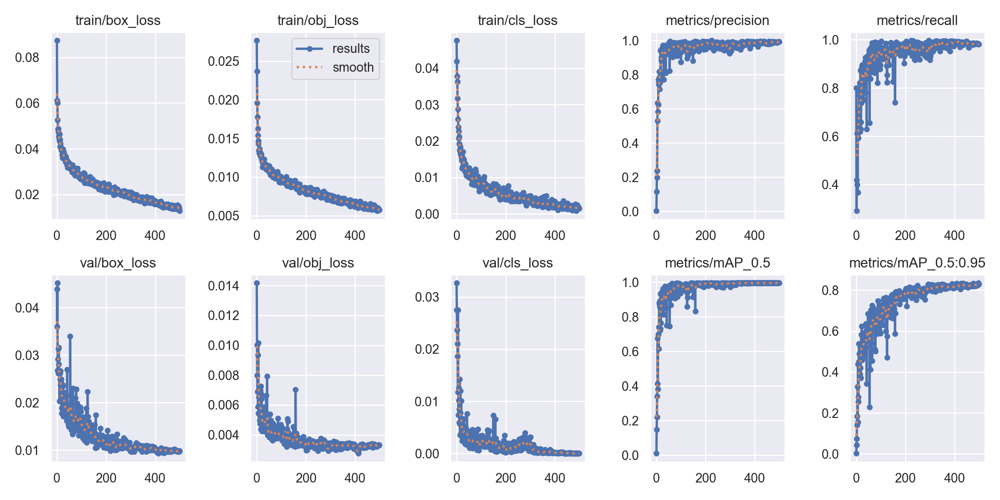

In [5]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
from IPython.display import Image
Image(filename=r'C:\College\Projects\MVProjectv3\yolov5\runs\train\yolov5s_results11\results.png', width=1000)

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


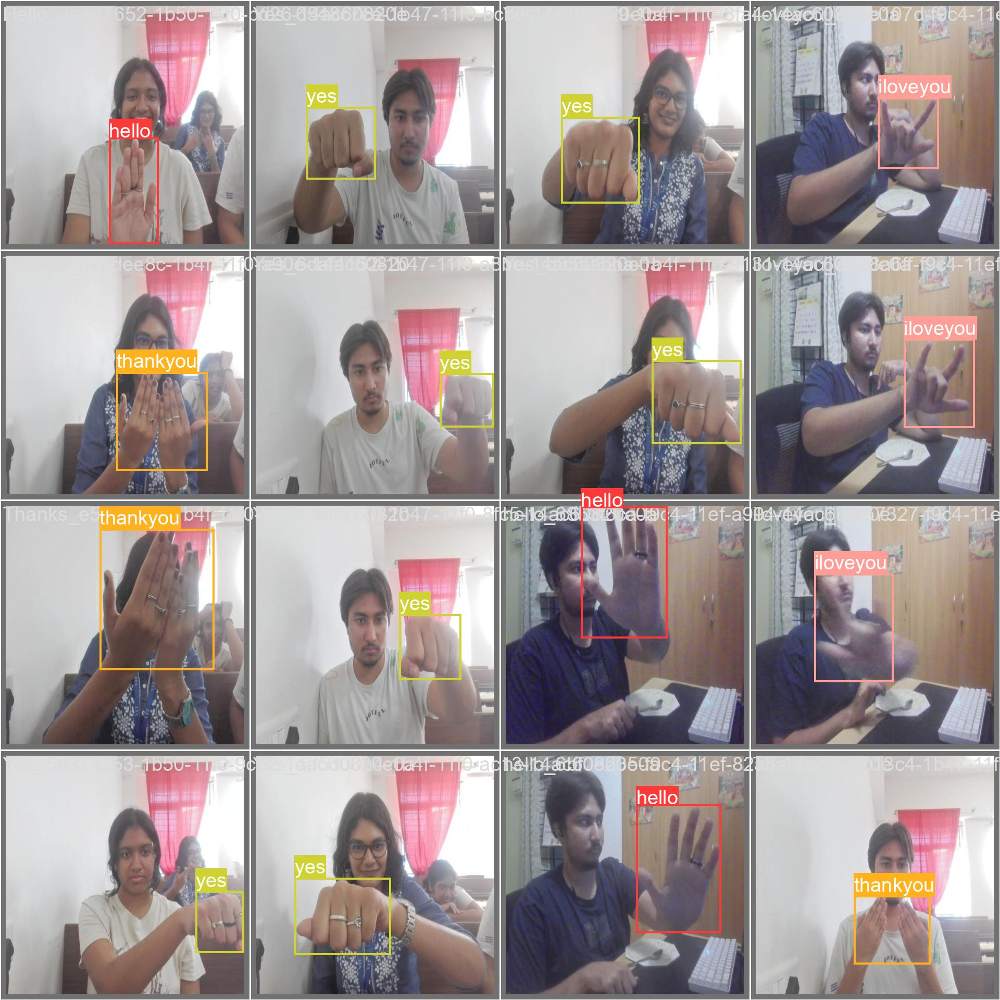

In [6]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename=r'C:\College\Projects\MVProjectv3\yolov5\runs\train\yolov5s_results11\val_batch0_labels.jpg', width=900)

PREDICTED DATA:


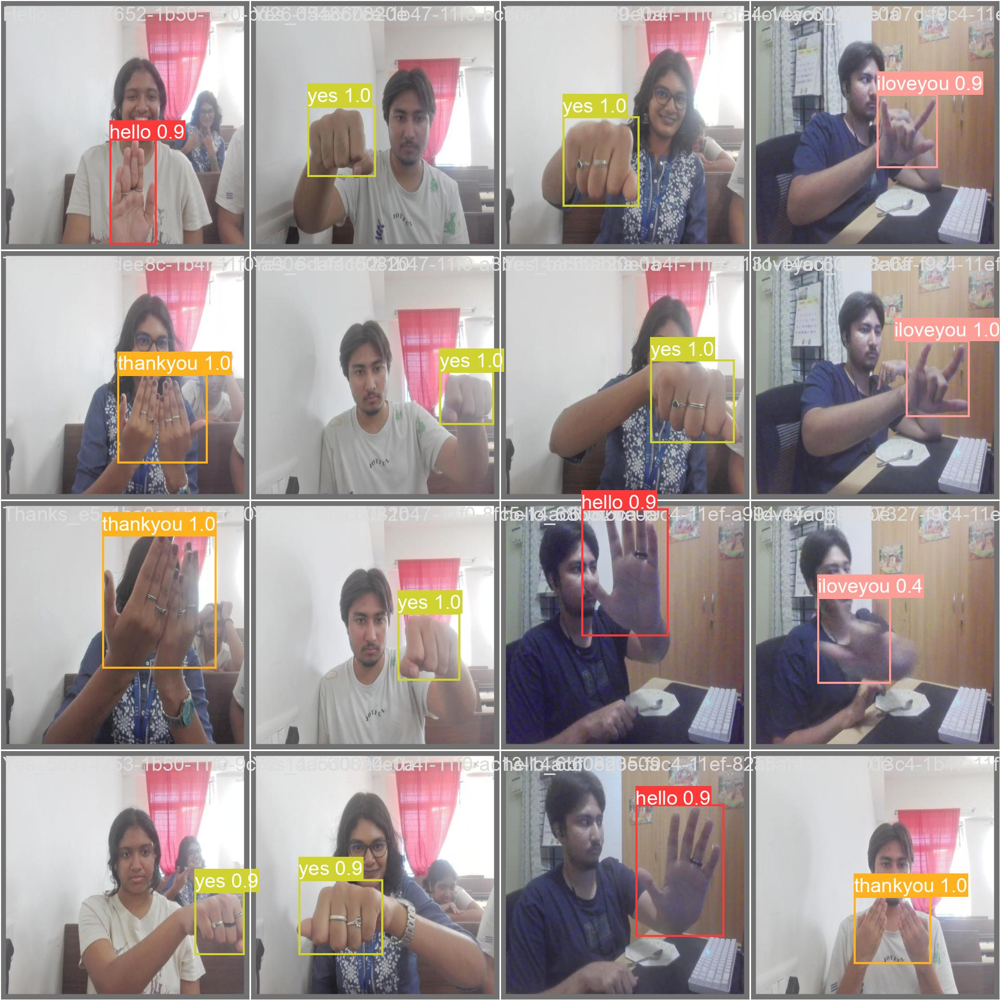

In [7]:
# then, display the model's prediction
print("PREDICTED DATA:")
Image(filename=r'C:\College\Projects\MVProjectv3\yolov5\runs\train\yolov5s_results11\val_batch0_pred.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


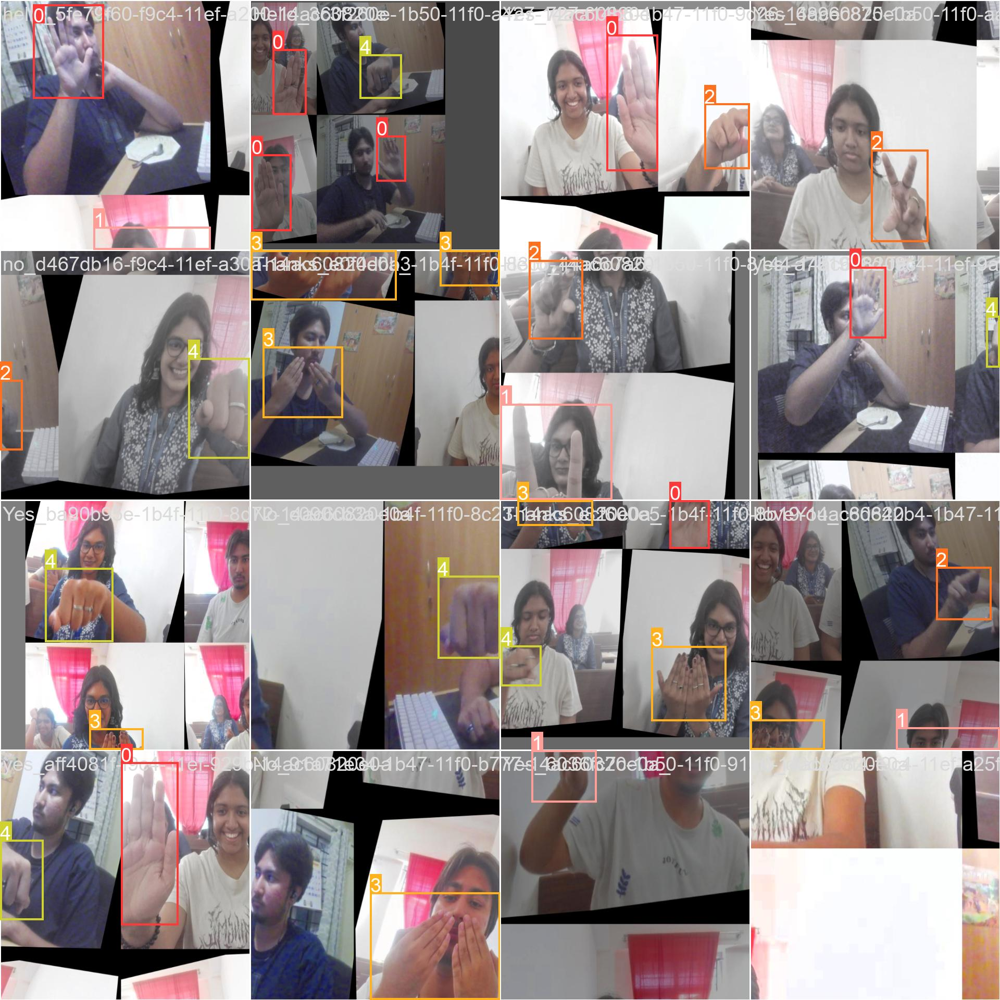

In [8]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename=r'C:\College\Projects\MVProjectv3\yolov5\runs\train\yolov5s_results11\train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [3]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd "C:\College\Study Materials\College Materials\6th Semester\Machine Vision\Projectv3\yolov5"
!python detect.py --weights "C:\College\Study Materials\College Materials\6th Semester\Machine Vision\Projectv3\yolov5\runs\train\yolov5s_results6\weights\best.pt" --img 416 --conf 0.5 --source "C:\College\Study Materials\College Materials\6th Semester\Machine Vision\Projectv3\Data\test\images"

C:\College\Study Materials\College Materials\6th Semester\Machine Vision\Projectv3\yolov5


detect: weights=['C:\\College\\Study Materials\\College Materials\\6th Semester\\Machine Vision\\Projectv3\\yolov5\\runs\\train\\yolov5s_results6\\weights\\best.pt'], source=C:\College\Study Materials\College Materials\6th Semester\Machine Vision\Projectv3\Data\test\images, data=data\coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to 'C:\College\Study': No such file or directory
YOLOv5  2025-4-15 Python-3.11.9 torch-2.1.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/11 C:\College\Study

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

### Now Moving onto Live Camera Feed Sign Recognition

In [4]:
%pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


Run the below cell onwards to get the realtime preictions from the model

In [1]:
import torch
import cv2
import yaml

In [2]:
weights_path = r"C:\College\Projects\MVProjectv3\yolov5\runs\train\yolov5s_results11\weights\best.pt"
data_yaml_path = r"C:\College\Projects\MVProjectv3\Data-2\data.yaml"
yolov5_dir = r"C:\College\Projects\MVProjectv3\yolov5"

In [3]:
model = torch.hub.load(yolov5_dir, 'custom', path=weights_path, source='local', force_reload=True)
model.eval()

YOLOv5  v7.0-411-gf4d8a84c Python-3.11.9 torch-2.1.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [4]:
# Load class names from YAML
with open(data_yaml_path, 'r') as f:
    class_names = yaml.safe_load(f)['names']

In [5]:
cap = cv2.VideoCapture(0)
while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Inference
    results = model(frame)

    # Render results on image (automatically draws boxes/labels)
    annotated_frame = results.render()[0]

    # Show the frame
    cv2.imshow('ASL Detection', annotated_frame)

    # Press 'q' to quit
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()